In [1]:
import time
from time import process_time
# starting process
start_time = time.process_time()

In [2]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [3]:
# Specify date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 7

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2015-10-25 17:13:04.968618 and End date: 2022-10-25 09:57:28.968618


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [4]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.tech_list + ds.energy_list + ds.industrials_list + ds.financials_list # ds.blend_list 

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'AAPL', 'IBM', 'TSLA', 'GOOGL', 'MSFT', 'CSCO', 'TSM', 'NVDA', 'DVN', 'OXY', 'NEE', 'MRO', 'APA', 'TRGP', 'PSX', 'EQT', 'BA', 'GE', 'CNI', 'NOC', 'LPX', 'BLDR', 'AAL', 'CPA', 'CAR', 'CPA', 'HXL', 'BHF', 'AIG', 'EQH', 'PFG', 'WBS', 'UNM', 'FHN', 'LPLA']


### 2. Data Preparation

In [5]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [6]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(1763, 210)

Attributes    Adj Close                                                  \
Symbols     SP500_index        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2016-02-29  1932.229980   22.286470   93.440300   12.795333   35.861000   
2018-08-09  2853.580078   50.133728  113.739861   23.496668   63.223000   
2015-11-04  2102.310059   27.849297   99.049057   15.442000   37.765499   
2022-04-22  4271.779785  161.328537  134.893478  335.016663  119.635498   
2018-04-13  2656.300049   41.776218  120.467384   20.022667   51.801998   

Attributes                                                           ...  \
Symbols           MSFT       CSCO        TSM        NVDA        DVN  ...   
Date                                                                 ...   
2016-02-29   46.073227  21.159063  19.113407    7.687035  15.787665  ...   
2018-08-09  104.506439  38.512440  37.710838   63.563091  34.620571  ...   
2015-11-04   48.582069  22.831963  19.113407    6.819937  37.043079  ...   
2022-04-22  272.814178  50.433399  94.643410  195.050781  55.837811  ...   
2018-04-13   88.314758  37.533752  37.084579   57.341343  27.598434  ...   

Attributes     Volume                                                         \
Symbols           CAR       HXL        BHF         AIG        EQH        PFG   
Date                                                                           
2016-02-29  3996000.0  367000.0        NaN  11746500.0        NaN  1929600.0   
2018-08-09  2346800.0  301900.0   801900.0   3460800.0   607000.0   800000.0   
2015-11-04  3316000.0  584300.0        NaN  22499400.0        NaN   980000.0   
2022-04-22   812300.0  652000.0   435600.0   4865200.0  2294400.0  1308400.0   
2018-04-13  1045100.0  290800.0  1003700.0   4468700.0        NaN  1850200.0   

Attributes                                             
Symbols          WBS        UNM        FHN       LPLA  
Date                                                   
2016-02-29  634100.0  1588200.0  4514800.0  1977800.0  
2018-08-09  200900.0  1533400.0  2553800.0   337500.0  
2015-11-04  759600.0   934700.0  1696000.0   437800.0  
2022-04-22  893500.0  4262000.0  5786000.0   852000.0  
2018-04-13  259600.0  1116500.0  9077000.0   627100.0  

[5 rows x 210 columns]

#### Cleaned Stock Data dataframe - close prices

In [7]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 36 columns from 210 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(1763, 36)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
1630,2022-04-18,4391.689941,165.070007,126.169998,334.763336,127.676498,280.519989,51.110001,98.769997,217.830002,...,266.480011,56.070000,53.380001,63.900002,30.969999,73.919998,50.779999,33.009998,23.100000,213.020004
1089,2020-02-25,3128.209961,72.019997,135.478012,53.327332,69.316002,168.070007,42.740002,53.860001,65.512497,...,40.220001,70.150002,41.610001,45.240002,24.030001,49.480000,42.130001,25.600000,15.070000,84.480003
34,2015-12-14,2021.939941,28.120001,129.952194,14.572000,38.126999,55.139999,26.490000,22.219999,8.142500,...,33.080002,44.990002,NaN,58.419998,NaN,44.990002,37.169998,33.299999,14.170000,42.980000
272,2016-11-22,2202.939941,27.950001,155.516251,12.744667,39.250000,61.119999,29.889999,29.910000,23.412500,...,39.650002,50.040001,NaN,64.000000,NaN,57.680000,48.770000,42.599998,18.570000,40.709999
1734,2022-09-15,3901.350098,152.369995,125.489998,303.750000,102.910004,245.380005,43.290001,77.980003,129.289993,...,161.699997,58.750000,49.270000,54.180000,29.510000,77.470001,47.720001,40.700001,23.459999,233.199997


#### Confirm and review raw data storage in csv file

In [8]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(1763, 210)

Attributes    Adj Close                                                  \
Symbols           ^GSPC        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2021-10-15  4471.370117  144.032898  131.533218  281.010010  141.367996   
2019-04-25  2926.169922   49.827782  111.588257   16.508667   63.367001   
2018-09-12  2888.919922   53.245560  115.154015   19.369333   58.580002   
2017-04-26  2387.449951   33.817497  118.220985   20.677999   44.457001   
2021-11-19  4697.959961  159.888382  111.884766  379.019989  148.926498   

Attributes                                                            ...  \
Symbols           MSFT       CSCO         TSM        NVDA        DVN  ...   
Date                                                                  ...   
2021-10-15  301.683380  53.568554  112.604500  218.444885  37.212681  ...   
2019-04-25  124.606506  50.592045   40.090294   46.444798  27.810921  ...   
2018-09-12  106.860062  41.248253   39.603588   66.509193  34.521812  ...   
2017-04-26   63.037350  28.198105   27.788389   25.681648  33.106197  ...   
2021-11-19  340.882812  51.629421  121.819901  329.585815  37.676678  ...   

Attributes     Volume                                                        \
Symbols           CAR       HXL       BHF         AIG        EQH        PFG   
Date                                                                          
2021-10-15  1461400.0  370100.0  376200.0   3931900.0  2106800.0  1093500.0   
2019-04-25   741200.0  881800.0  931000.0   6002300.0  2941800.0  1679000.0   
2018-09-12  2435200.0  560400.0  466400.0   4775500.0   963700.0   910000.0   
2017-04-26  2237700.0  486500.0       NaN  12413500.0        NaN  1010400.0   
2021-11-19   961300.0  678800.0  516000.0   4864300.0  2232800.0  2455200.0   

Attributes                                            
Symbols          WBS        UNM        FHN      LPLA  
Date                                                  
2021-10-15  728200.0  1611000.0  3695800.0  683100.0  
2019-04-25  485800.0  2067200.0  1433000.0  562500.0  
2018-09-12  388600.0  1916900.0  2097000.0  427100.0  
2017-04-26  808000.0  1633100.0  3547200.0  408200.0  
2021-11-19  325900.0  2401200.0  2389600.0  361700.0  

[5 rows x 210 columns]

#### Clean, confirm, and review sample from csv raw data

In [9]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-26,2071.179932,28.820000,137.342255,14.350667,36.556000,54.250000,28.950001,22.160000,7.115000,42.790001,...,49.990002,45.919998,NaN,61.160000,NaN,50.590000,37.080002,33.340000,13.950000,41.119999
2015-10-27,2065.889893,28.637501,131.797318,14.023333,36.640999,53.689999,29.049999,22.200001,7.110000,41.200001,...,48.630001,45.790001,NaN,60.919998,NaN,48.990002,36.830002,32.959999,13.780000,40.470001
2015-10-28,2090.350098,29.817499,134.636703,14.197333,36.846001,53.980000,29.360001,22.080000,7.167500,41.560001,...,49.889999,47.230000,NaN,63.889999,NaN,51.000000,38.459999,34.130001,14.500000,41.209999
2015-10-29,2089.409912,30.132500,134.369019,14.108667,37.242500,53.360001,29.139999,21.820000,6.920000,41.040001,...,49.869999,46.869999,NaN,63.490002,NaN,50.799999,38.139999,34.610001,14.500000,42.910000
2015-10-30,2079.360107,29.875000,133.919693,13.795333,36.869499,52.639999,28.850000,21.959999,7.092500,41.930000,...,49.939999,46.320000,NaN,63.060001,NaN,50.160000,37.099998,34.650002,14.180000,42.599998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-19,3695.159912,143.860001,122.510002,222.039993,99.629997,236.479996,41.880001,63.660000,120.510002,71.940002,...,180.199997,56.250000,50.570000,52.750000,28.139999,78.769997,48.549999,43.099998,24.070000,237.059998
2022-10-20,3665.780029,143.389999,128.300003,207.279999,99.970001,236.149994,41.709999,63.580002,121.940002,71.680000,...,180.529999,55.529999,49.779999,51.849998,27.440001,77.559998,49.529999,42.459999,24.040001,235.270004
2022-10-21,3752.750000,147.270004,129.899994,214.440002,101.129997,242.119995,42.799999,63.750000,124.660004,74.290001,...,189.350006,57.169998,52.150002,53.250000,28.170000,78.839996,50.869999,43.590000,24.190001,238.520004


### Create 'basket' from SQLite temp db

In [10]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(1763, 36)

,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
1135,2020-04-30,2912.429932,73.449997,120.038239,52.125332,67.334999,179.210007,42.380001,53.130001,73.070000,...,16.480000,34.590000,25.709999,25.430000,18.320000,36.410000,28.250000,17.450001,9.080000,60.220001
1426,2021-06-25,4280.700195,133.110001,140.382416,223.956665,122.508499,265.019989,53.060001,116.529999,190.309998,...,80.750000,64.220001,46.549999,49.020000,30.969999,64.360001,57.180000,29.330000,17.860001,142.570007
1116,2020-04-02,2526.899902,61.232498,105.162521,30.298000,55.851501,155.259995,39.799999,48.130001,63.867500,...,11.260000,32.740002,20.389999,21.250000,13.390000,26.600000,20.969999,12.960000,7.700000,51.389999
1080,2020-02-11,3357.750000,79.902496,146.730408,51.625332,75.502998,184.440002,49.130001,58.660000,66.972504,...,38.599998,73.220001,46.599998,54.470001,26.900000,56.340000,46.880001,29.650000,16.620001,95.970001
1692,2022-07-18,3830.850098,147.070007,138.130005,240.546661,109.029999,254.250000,42.599998,83.580002,161.009995,...,152.350006,53.900002,40.189999,49.889999,25.520000,62.529999,43.930000,32.360001,21.910000,178.960007


Indexed dataframe counts and column summary


(1763, 35)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-01,3966.850098,157.960007,129.660004,277.160004,109.739998,260.399994,45.290001,81.639999,139.369995,68.160004,...,165.559998,58.150002,47.240002,52.34,29.530001,74.680000,46.639999,37.910000,22.600000,222.470001
2022-05-26,4057.840088,143.779999,136.889999,235.910004,107.792503,265.899994,44.990002,91.000000,178.509995,73.809998,...,185.039993,57.090000,48.450001,57.73,30.250000,71.980003,47.680000,35.970001,23.090000,194.649994
2018-10-23,2740.689941,55.682499,125.439774,19.609333,55.745499,108.099998,45.419998,38.000000,55.264999,33.730000,...,30.920000,60.529999,40.560001,44.18,20.850000,51.389999,60.230000,36.230000,15.470000,55.750000
2022-04-26,4175.200195,156.800003,136.190002,292.140015,118.650002,270.220001,50.900002,92.769997,187.880005,56.400002,...,273.529999,56.279999,50.880001,57.66,29.100000,69.860001,48.500000,31.250000,22.809999,188.490005
2018-05-02,2635.669922,44.142502,136.185471,20.076668,51.302502,93.510002,43.860001,37.750000,56.577499,38.230000,...,48.980000,65.739998,48.200001,54.84,NaN,56.799999,60.849998,39.779999,18.379999,60.750000


### 3. Quant Analysis

In [11]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.03
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.9217
Number of days of input dataframe to use as test/experiment data  =  0.07830000000000004


In [12]:
display(sql_basket_indexed_df.shape)

(1763, 35)

In [13]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data sample = ", num_historical_days_percent)
print("Total # of days will use for [back] testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1763
Total # of days will use for hisotrical data sample =  1625
Total # of days will use for [back] testing results =  138


In [14]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [15]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [16]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [17]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(984, 35)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2021-06-18,-0.013124,-0.010092,-0.017033,0.010882,-0.013409,-0.005634,-0.019951,-0.027955,-0.000992,-0.030446,...,-0.019760,-0.001646,-0.040564,-0.039369,-0.035714,-0.033490,-0.027856,-0.043863,-0.019332,-0.033321
2018-05-29,-0.011564,-0.003606,-0.016848,0.017608,-0.014768,-0.003558,-0.006704,-0.029008,-0.002768,0.007639,...,-0.041795,-0.009823,-0.038939,-0.021013,-0.055125,-0.051348,-0.021716,-0.038770,-0.030127,-0.042811
2020-03-19,0.004708,-0.007662,-0.031000,0.183877,0.018768,0.016453,0.015894,-0.010818,0.050044,0.210721,...,0.244216,0.039272,0.032934,0.096912,-0.020870,-0.011760,0.002972,-0.083051,0.183844,0.158124
2018-10-24,-0.030864,-0.034302,-0.030486,-0.019175,-0.051834,-0.053469,-0.029723,-0.040000,-0.097937,-0.047435,...,-0.109961,-0.037172,-0.032298,-0.044138,-0.043165,-0.047869,-0.047651,-0.061551,-0.032321,-0.045740
2021-12-07,0.020707,0.035446,0.013927,0.042358,0.028742,0.026764,0.019663,0.026691,0.079569,0.065156,...,-0.046890,-0.003604,0.002165,0.007668,0.019033,0.017719,-0.005814,0.019459,0.004217,0.021206


In [18]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [LPLA]   (LPLA_count)

In [19]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

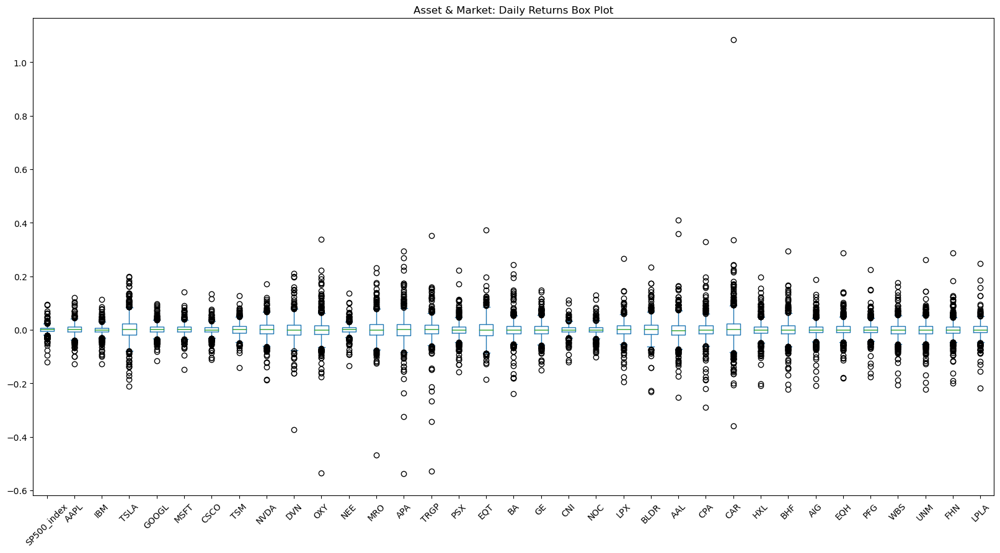

In [20]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [21]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.214629
CNI            0.260590
NEE            0.272069
IBM            0.282250
NOC            0.289866
CSCO           0.290225
GOOGL          0.296123
MSFT           0.300648
AAPL           0.331730
TSM            0.347460
PFG            0.406626
AIG            0.427277
LPLA           0.429188
PSX            0.434906
EQH            0.439432
GE             0.458286
LPX            0.472524
HXL            0.473617
FHN            0.474007
WBS            0.479389
UNM            0.490019
NVDA           0.503175
BA             0.525845
BLDR           0.541345
BHF            0.562198
CPA            0.582786
EQT            0.621153
MRO            0.627558
DVN            0.628391
AAL            0.647855
TRGP           0.648918
TSLA           0.668229
OXY            0.679462
APA            0.755452
CAR            0.970730
dtype: float64

In [22]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 1000,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio"
)

Assets & Market: Annual Sharpe Ratio (Sorted):


BA            -0.056025
AAL           -0.034829
PSX            0.028276
IBM            0.084354
GE             0.100876
HXL            0.119861
CPA            0.120158
WBS            0.136010
UNM            0.151259
OXY            0.213198
CSCO           0.287243
BHF            0.304661
AIG            0.311454
PFG            0.348170
FHN            0.352732
MRO            0.389063
APA            0.399798
EQT            0.420175
NOC            0.450691
DVN            0.465749
EQH            0.473167
TRGP           0.547150
CNI            0.584142
LPX            0.645157
SP500_index    0.702434
LPLA           0.794784
BLDR           0.811572
NEE            0.860863
TSM            0.862019
CAR            0.883571
NVDA           0.926999
GOOGL          0.930441
MSFT           1.103318
AAPL           1.159042
TSLA           1.422511
dtype: float64

:Bars   [index]   (0)

In [23]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-26,28.820000,137.342255,14.350667,36.556000,54.250000,28.950001,22.160000,7.115000,42.790001,71.538177,...,49.990002,45.919998,NaN,61.160000,NaN,50.590000,37.080002,33.340000,13.950000,41.119999
2015-10-27,28.637501,131.797318,14.023333,36.640999,53.689999,29.049999,22.200001,7.110000,41.200001,70.080658,...,48.630001,45.790001,NaN,60.919998,NaN,48.990002,36.830002,32.959999,13.780000,40.470001
2015-10-28,29.817499,134.636703,14.197333,36.846001,53.980000,29.360001,22.080000,7.167500,41.560001,73.684525,...,49.889999,47.230000,NaN,63.889999,NaN,51.000000,38.459999,34.130001,14.500000,41.209999
2015-10-29,30.132500,134.369019,14.108667,37.242500,53.360001,29.139999,21.820000,6.920000,41.040001,74.003983,...,49.869999,46.869999,NaN,63.490002,NaN,50.799999,38.139999,34.610001,14.500000,42.910000
2015-10-30,29.875000,133.919693,13.795333,36.869499,52.639999,28.850000,21.959999,7.092500,41.930000,74.413284,...,49.939999,46.320000,NaN,63.060001,NaN,50.160000,37.099998,34.650002,14.180000,42.599998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-31,174.610001,130.020004,359.200012,139.067505,308.309998,55.759998,104.260002,272.859985,59.130001,56.740002,...,263.299988,59.470001,51.660000,62.770000,30.910000,73.410004,56.119999,31.510000,23.490000,182.679993
2022-04-01,174.309998,130.149994,361.529999,140.150497,309.420013,55.660000,102.790001,267.119995,60.349998,58.110001,...,260.579987,59.980000,52.410000,63.790001,30.850000,73.889999,55.660000,31.620001,23.549999,183.380005
2022-04-04,178.440002,130.270004,381.816681,142.971497,314.970001,55.869999,104.790001,273.600006,60.849998,57.790001,...,283.739990,58.619999,51.430000,62.540001,30.870001,73.410004,54.520000,30.610001,23.620001,184.389999


In [24]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
AAPL,0.110045,0.042570,0.096270,0.066456,0.076280,0.057332,0.064855,0.108093,0.068744,0.061184,...,0.080136,0.047597,0.078799,0.051874,0.064012,0.057893,0.055920,0.064230,0.050957,0.065443
IBM,0.042570,0.079665,0.041704,0.038996,0.041986,0.049450,0.039301,0.052616,0.079961,0.082824,...,0.086331,0.062022,0.094340,0.066793,0.072715,0.068084,0.073180,0.083711,0.065986,0.060247
TSLA,0.096270,0.041704,0.446530,0.074577,0.089618,0.050503,0.087587,0.147955,0.104356,0.091302,...,0.146581,0.081790,0.097260,0.070441,0.079379,0.065891,0.072399,0.071616,0.080395,0.093341
GOOGL,0.066456,0.038996,0.074577,0.087689,0.070662,0.048145,0.054164,0.094824,0.071498,0.063295,...,0.086767,0.051460,0.075120,0.052282,0.059791,0.054008,0.053838,0.056426,0.048727,0.063191
MSFT,0.076280,0.041986,0.089618,0.070662,0.090389,0.057097,0.058071,0.105758,0.062208,0.053876,...,0.081506,0.046354,0.073834,0.050189,0.060501,0.053641,0.052066,0.057124,0.046421,0.063083


Correlation Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
AAPL,1.000000,0.454659,0.434292,0.676516,0.764834,0.595492,0.562672,0.647581,0.329775,0.271450,...,0.248854,0.302947,0.422518,0.365978,0.439122,0.429187,0.351637,0.395127,0.324069,0.459651
IBM,0.454659,1.000000,0.221116,0.466567,0.494777,0.603666,0.400742,0.370476,0.450830,0.431874,...,0.315090,0.463960,0.594525,0.553846,0.586268,0.593218,0.540839,0.605253,0.493210,0.497338
TSLA,0.434292,0.221116,1.000000,0.376883,0.446078,0.260408,0.377232,0.440033,0.248520,0.201089,...,0.225972,0.258431,0.258894,0.246712,0.270328,0.242496,0.226006,0.218712,0.253817,0.325461
GOOGL,0.676516,0.466567,0.376883,1.000000,0.793704,0.560204,0.526426,0.636394,0.384232,0.314580,...,0.301847,0.366921,0.451224,0.413211,0.459486,0.448530,0.379256,0.388861,0.347149,0.497204
MSFT,0.764834,0.494777,0.446078,0.793704,1.000000,0.654362,0.555901,0.699096,0.329273,0.263739,...,0.279277,0.325540,0.436829,0.390699,0.457947,0.438779,0.361246,0.387747,0.325737,0.488883
CSCO,0.595492,0.603666,0.260408,0.560204,0.654362,1.000000,0.453201,0.504065,0.394212,0.346663,...,0.295266,0.367834,0.497487,0.465748,0.502965,0.524475,0.452179,0.498661,0.416172,0.484014
TSM,0.562672,0.400742,0.377232,0.526426,0.555901,0.453201,1.000000,0.627282,0.335758,0.292897,...,0.244416,0.355619,0.430566,0.350001,0.433593,0.403043,0.367402,0.404056,0.332093,0.436457
NVDA,0.647581,0.370476,0.440033,0.636394,0.699096,0.504065,0.627282,1.000000,0.305896,0.215420,...,0.257464,0.278892,0.381709,0.309402,0.386305,0.355423,0.284893,0.323742,0.258507,0.421974
DVN,0.329775,0.450830,0.248520,0.384232,0.329273,0.394212,0.335758,0.305896,1.000000,0.788141,...,0.389379,0.515306,0.578767,0.573756,0.575276,0.597667,0.589099,0.580393,0.605418,0.566331
OXY,0.271450,0.431874,0.201089,0.314580,0.263739,0.346663,0.292897,0.215420,0.788141,1.000000,...,0.309002,0.522324,0.551965,0.538585,0.554882,0.579264,0.561950,0.559049,0.587516,0.468457


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

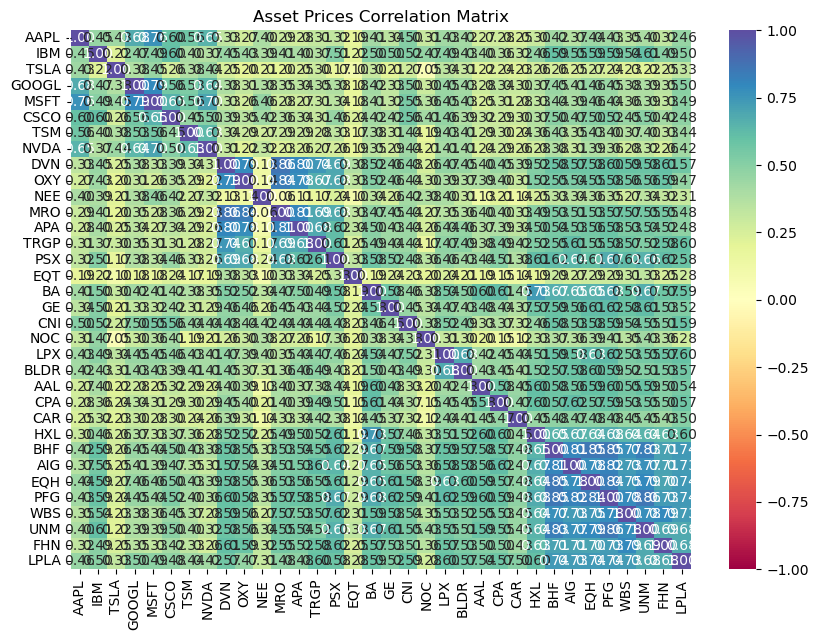

In [25]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot = True, 
    vmin = -1, 
    vmax = 1, 
    fmt = '.2f', 
    cmap = 'Spectral'
).set(
    title='Asset Prices Correlation Matrix'
)

In [26]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


AAPL     0.384489
IBM      0.023809
TSLA     0.950563
GOOGL    0.275525
MSFT     0.331710
CSCO     0.083365
TSM      0.299518
NVDA     0.466443
DVN      0.292673
OXY      0.144860
NEE      0.234214
MRO      0.244160
APA      0.302028
TRGP     0.355055
PSX      0.012298
EQT      0.260993
BA      -0.029460
GE       0.046230
CNI      0.152221
NOC      0.130640
LPX      0.304852
BLDR     0.439340
AAL     -0.022564
CPA      0.070026
CAR      0.857708
HXL      0.056768
BHF      0.171280
AIG      0.133077
EQH      0.207925
PFG      0.141575
WBS      0.065202
UNM      0.074120
FHN      0.167197
LPLA     0.341112
dtype: float64

___
### Efficient Frontier Computation

In [27]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 37)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,AAPL_W,IBM_W,TSLA_W,GOOGL_W,MSFT_W,CSCO_W,TSM_W,...,CAR_W,HXL_W,BHF_W,AIG_W,EQH_W,PFG_W,WBS_W,UNM_W,FHN_W,LPLA_W
2787,0.226935,5.311027,0.037080,0.022485,0.009059,0.022055,0.012196,0.052398,0.010655,0.022223,...,0.022606,0.016311,0.018355,0.042213,0.038807,0.009207,0.050980,0.043021,0.029931,0.041416
2476,0.228308,5.163033,0.038409,0.053891,0.012380,0.016596,0.022375,0.018404,0.051038,0.027018,...,0.033227,0.044813,0.018092,0.026917,0.026119,0.045675,0.030662,0.046668,0.053905,0.005262
6811,0.222969,4.945433,0.039020,0.050917,0.042186,0.041461,0.037735,0.054820,0.046570,0.002333,...,0.027873,0.016626,0.003081,0.024112,0.007224,0.052365,0.023764,0.029017,0.041636,0.049693
8996,0.240325,5.469814,0.038452,0.012945,0.023622,0.041844,0.053347,0.035966,0.043616,0.041058,...,0.041961,0.033596,0.037610,0.014355,0.040241,0.029292,0.039866,0.050988,0.040092,0.038910
4495,0.224447,5.515283,0.035256,0.005876,0.009025,0.016842,0.039845,0.012198,0.032123,0.034180,...,0.021470,0.039043,0.024902,0.051766,0.021755,0.024780,0.050506,0.040461,0.005483,0.051226


In [28]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.234030
Volatility     4.440310
SharpeRatio    0.045950
AAPL_W         0.046481
IBM_W          0.050838
TSLA_W         0.042684
GOOGL_W        0.050912
MSFT_W         0.043779
CSCO_W         0.061114
TSM_W          0.060535
NVDA_W         0.050131
DVN_W          0.004661
OXY_W          0.000655
NEE_W          0.047369
MRO_W          0.003015
APA_W          0.010775
TRGP_W         0.021194
PSX_W          0.035831
EQT_W          0.062863
BA_W           0.047234
GE_W           0.019243
CNI_W          0.030454
NOC_W          0.052408
LPX_W          0.005471
BLDR_W         0.017530
AAL_W          0.019102
CPA_W          0.007146
CAR_W          0.013120
HXL_W          0.003462
BHF_W          0.011503
AIG_W          0.051064
EQH_W          0.026769
PFG_W          0.022862
WBS_W          0.063196
UNM_W          0.001074
FHN_W          0.003642
LPLA_W         0.011880
Name: 987, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.220082
Volatility     6.126198
SharpeRatio    0.031028
AAPL_W         0.008165
IBM_W          0.012147
TSLA_W         0.000003
GOOGL_W        0.005305
MSFT_W         0.018306
CSCO_W         0.041210
TSM_W          0.018722
NVDA_W         0.002360
DVN_W          0.039345
OXY_W          0.046303
NEE_W          0.004096
MRO_W          0.045969
APA_W          0.047359
TRGP_W         0.055166
PSX_W          0.028668
EQT_W          0.058407
BA_W           0.030433
GE_W           0.032182
CNI_W          0.008031
NOC_W          0.000700
LPX_W          0.034351
BLDR_W         0.058545
AAL_W          0.060792
CPA_W          0.007238
CAR_W          0.043795
HXL_W          0.014715
BHF_W          0.033949
AIG_W          0.055828
EQH_W          0.036855
PFG_W          0.034950
WBS_W          0.045111
UNM_W          0.001840
FHN_W          0.052177
LPLA_W         0.016977
Name: 4191, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.309150
Volatility     5.088578
SharpeRatio    0.054858
AAPL_W         0.048641
IBM_W          0.001010
TSLA_W         0.049314
GOOGL_W        0.050293
MSFT_W         0.052699
CSCO_W         0.050035
TSM_W          0.015684
NVDA_W         0.035621
DVN_W          0.039093
OXY_W          0.033735
NEE_W          0.052451
MRO_W          0.005644
APA_W          0.035916
TRGP_W         0.022914
PSX_W          0.030442
EQT_W          0.020135
BA_W           0.017682
GE_W           0.010327
CNI_W          0.026150
NOC_W          0.041593
LPX_W          0.056194
BLDR_W         0.055629
AAL_W          0.006135
CPA_W          0.006860
CAR_W          0.054134
HXL_W          0.010387
BHF_W          0.001692
AIG_W          0.011358
EQH_W          0.025583
PFG_W          0.001668
WBS_W          0.021059
UNM_W          0.031967
FHN_W          0.022270
LPLA_W         0.055682
Name: 2806, dtype: float64

In [29]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter(
    (
        efficient_frontier_df['Volatility'], 
        efficient_frontier_df['Returns'], 
        efficient_frontier_df.loc[:,'SharpeRatio']),
    'Volatility',
    ['Return', 'Sharpe Ratio'],
)
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', width=1000, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [30]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

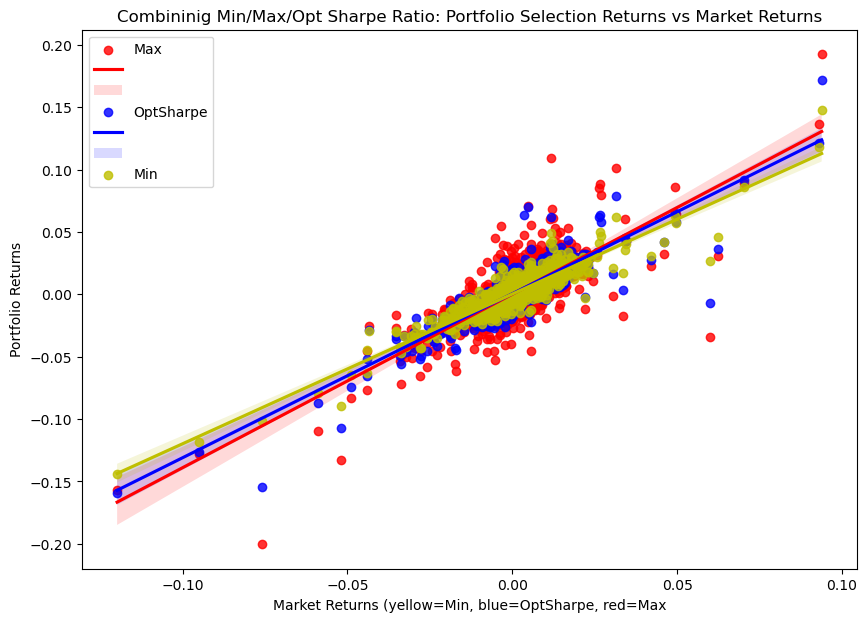

In [31]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

In [32]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_min_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Minimum / Lowest risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Balanced; Optimal Sharpe Ratio Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [34]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_max_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Max return, High risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [35]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
2022-04-08,170.089996,127.730003,341.829987,133.287506,296.970001,54.279999,99.290001,231.190002,62.369999,61.799999,...,244.710007,54.599998,51.299999,63.139999,31.459999,73.620003,50.0,32.23,23.4,194.979996


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
2022-10-25,151.020004,132.0,220.520004,103.449997,249.169006,43.994999,60.970001,130.850006,75.370003,71.059998,...,227.315002,55.34,53.459999,53.809898,29.200001,80.074997,52.279999,44.279999,24.34,240.389999


___
### Monte-Carlo Dataframe Weights List

In [36]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)

In [37]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]

print("Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:")
display(investment_pnl_min)
display(investment_pnl_opt_sharpe_ratio)
display(investment_pnl_max)

Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:


8977.023496627808

9553.683437347412

9905.819584846497

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [38]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 1200


In [39]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [40]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [41]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   
2022-10-24  149.449997     0.014803  132.690002     0.021478  211.250000   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   
2022-10-24    -0.014876  102.519997     0.013745  247.250000     0.021188   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   
2022-10-24  ...  80.029999     0.015094  52.230000     0.026735  44.139999   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  
2022-10-24     0.012618  24.200001     0.000413  240.660004     0.008972  

[5 rows x 68 columns]

In [42]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.993583,0.992590,1.000977,1.015088,0.999884,0.997242,0.994787,1.001679,1.001249,1.003971,...,0.999117,1.002131,1.003414,0.997687,0.993170,1.002928,0.996470,1.008669,0.999674,1.007317
2,0.998453,0.988740,0.987369,1.020078,1.014050,0.996116,0.995017,0.988625,0.997124,0.997658,...,0.996671,0.995894,0.997232,0.995828,0.986644,1.007708,1.000739,0.998001,1.002191,1.011087
3,0.993677,0.995042,0.985987,1.021394,1.019430,0.994065,0.984880,0.988557,0.999476,0.995995,...,0.985285,0.992731,0.980756,0.999577,0.989159,1.006588,1.006826,0.996403,1.013276,1.020997
4,0.998455,0.992331,0.976917,1.007076,1.026741,0.985628,0.986209,0.990114,0.991242,0.993523,...,0.976961,0.986716,0.976999,0.997416,1.000628,1.003312,1.001155,0.994341,1.015406,1.024917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.922160,0.983814,0.875846,0.988825,1.009685,0.876730,0.944246,0.931055,0.871990,1.002425,...,0.965156,0.897795,0.874297,0.848987,0.888995,0.979481,0.878784,0.836797,0.928507,0.902621
135,0.923471,0.982215,0.873829,0.987659,1.018161,0.876060,0.941649,0.933263,0.864394,0.993953,...,0.955913,0.894536,0.871334,0.848275,0.895772,0.989857,0.871249,0.827627,0.927432,0.892414
136,0.921111,0.987368,0.874512,0.990193,1.021452,0.869326,0.945099,0.936232,0.861207,0.993590,...,0.955649,0.886997,0.868876,0.856918,0.892058,0.985919,0.875258,0.829503,0.931095,0.889688
137,0.919026,0.980341,0.876789,0.989912,1.014639,0.870580,0.945740,0.942984,0.870449,0.991437,...,0.958950,0.884656,0.869276,0.855772,0.895277,0.989000,0.867014,0.829354,0.931450,0.890013


In [43]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   
2022-10-24  149.449997     0.014803  132.690002     0.021478  211.250000   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   
2022-10-24    -0.014876  102.519997     0.013745  247.250000     0.021188   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   
2022-10-24  ...  80.029999     0.015094  52.230000     0.026735  44.139999   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  
2022-10-24     0.012618  24.200001     0.000413  240.660004     0.008972  

[5 rows x 68 columns]

In [44]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.006030,0.983147,0.995998,1.004802,1.003076,0.988873,0.998569,0.998737,1.006035,0.994473,...,1.002755,1.001118,0.985278,1.000536,0.988117,0.995594,0.998922,1.006491,0.998656,1.003138
2,1.006796,0.984166,0.989100,1.005989,1.000172,0.996040,1.004321,1.000004,1.014985,0.990167,...,1.003826,1.006455,0.994435,1.012343,1.001147,1.003218,0.988265,1.008150,0.998341,0.995485
3,1.015294,0.993606,0.991490,1.009382,1.006981,0.992513,1.005859,0.999519,1.016917,0.979383,...,1.005959,1.006272,0.997698,1.009334,1.004613,1.005003,0.986208,1.010505,0.997511,0.988746
4,1.018338,0.991721,0.991846,1.014140,1.015947,0.995081,1.011207,0.995857,1.023416,0.982212,...,1.011641,0.991721,0.990056,1.007909,1.005226,1.001850,0.986288,1.005284,0.996428,0.989530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,1.068585,0.953283,1.011959,1.041488,0.919699,0.894450,0.923683,0.929411,1.088270,0.931357,...,0.998674,1.034215,1.008347,1.063144,1.025284,1.087370,0.954773,1.180844,1.156351,0.998275
135,1.069623,0.953302,1.015199,1.040731,0.924528,0.902714,0.928355,0.931662,1.092841,0.930494,...,0.998963,1.039106,1.012730,1.066953,1.016840,1.081022,0.944783,1.180139,1.138588,1.004101
136,1.078114,0.960040,1.017475,1.052748,0.922966,0.900518,0.934067,0.919496,1.091171,0.934531,...,1.004510,1.033850,1.013180,1.070221,1.028296,1.086525,0.946328,1.179247,1.129811,1.005680
137,1.082747,0.970949,1.016754,1.049898,0.916591,0.908583,0.932390,0.922376,1.083606,0.941004,...,1.003919,1.029610,1.008338,1.080319,1.028328,1.079860,0.942155,1.196892,1.119433,1.009118


In [45]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   
2022-10-24  149.449997     0.014803  132.690002     0.021478  211.250000   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   
2022-10-24    -0.014876  102.519997     0.013745  247.250000     0.021188   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   
2022-10-24  ...  80.029999     0.015094  52.230000     0.026735  44.139999   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  
2022-10-24     0.012618  24.200001     0.000413  240.660004     0.008972  

[5 rows x 68 columns]

In [46]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.989667,1.007277,0.999768,0.995181,1.002617,0.990931,1.004564,0.994525,0.994411,1.006962,...,0.999581,0.997992,1.001732,0.995110,0.988082,1.000616,1.004858,1.001803,1.004099,1.006112
2,0.984813,0.990032,0.989525,0.991482,1.000959,0.989829,1.018440,0.990215,0.997648,0.998150,...,0.992169,1.003864,0.990518,0.998001,0.985822,0.996504,1.003862,0.998465,1.001539,1.002118
3,0.993504,1.005900,0.979998,0.991641,0.999993,0.986861,1.032278,0.997038,1.001701,1.006200,...,1.007992,1.013035,0.990386,0.986476,0.993944,0.987287,1.013773,0.993927,0.999070,1.002320
4,0.983091,0.996250,0.978838,0.992113,1.004344,0.980628,1.033555,0.995348,1.000115,0.998706,...,1.013602,1.015113,0.982001,0.986292,0.993545,0.988899,1.024110,0.989057,0.994179,1.010944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.893351,1.022837,1.067625,1.107611,1.029169,0.894320,0.932512,0.859196,0.980031,1.048228,...,0.947748,0.916441,0.987368,0.989053,1.015478,0.923369,0.925601,0.913007,0.990825,1.214206
135,0.893651,1.021148,1.063736,1.104594,1.034934,0.896496,0.929364,0.848435,0.982300,1.051939,...,0.954885,0.925559,0.978497,0.995077,1.017563,0.917500,0.925567,0.919400,0.989938,1.202005
136,0.895423,1.016796,1.059829,1.098192,1.029606,0.900257,0.926171,0.848292,0.979705,1.055397,...,0.955916,0.917516,0.976603,0.991107,1.024383,0.922757,0.919401,0.922580,0.990564,1.205095
137,0.895711,1.013272,1.048775,1.094611,1.022249,0.901632,0.925814,0.845458,0.976609,1.056843,...,0.960706,0.923784,0.973385,1.003342,1.026145,0.913549,0.915256,0.931588,0.986872,1.207093


### 4. Visualizations

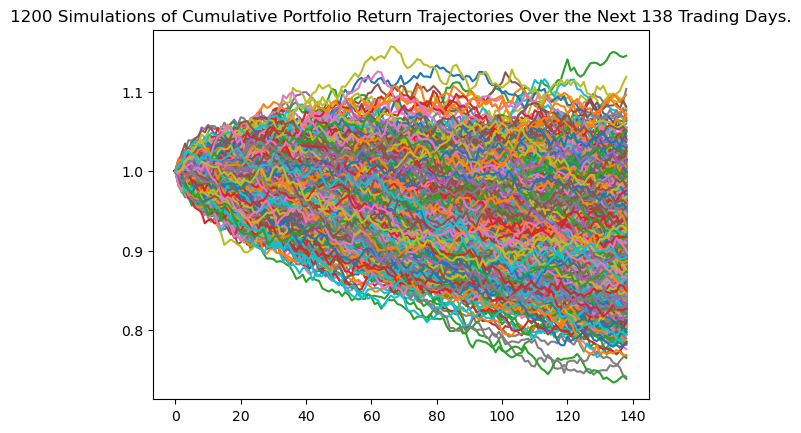

In [47]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

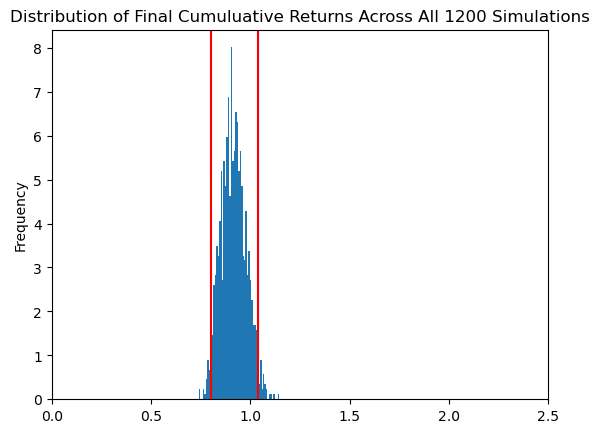

In [48]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

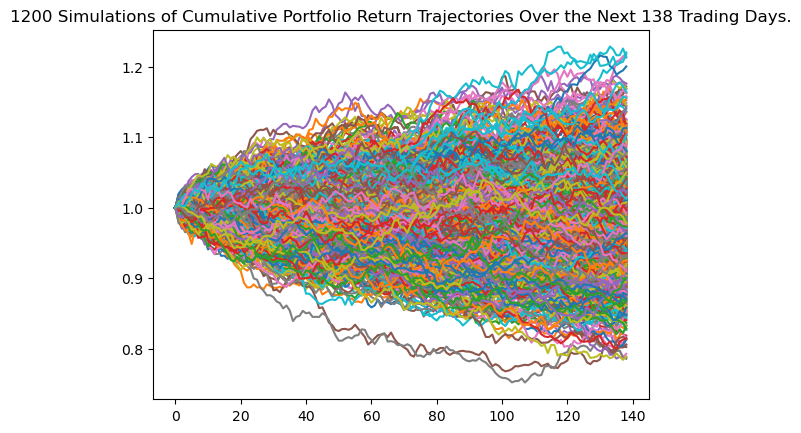

In [49]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

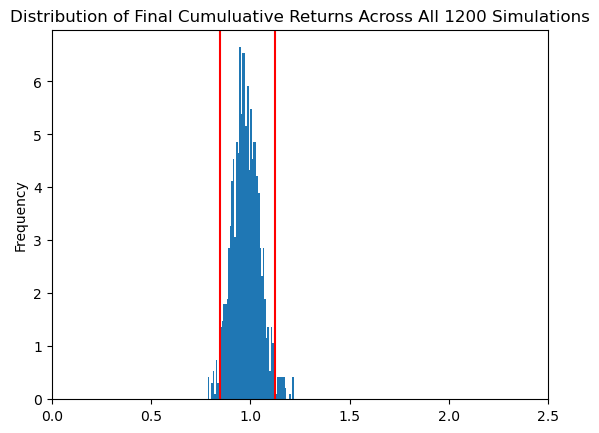

In [50]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

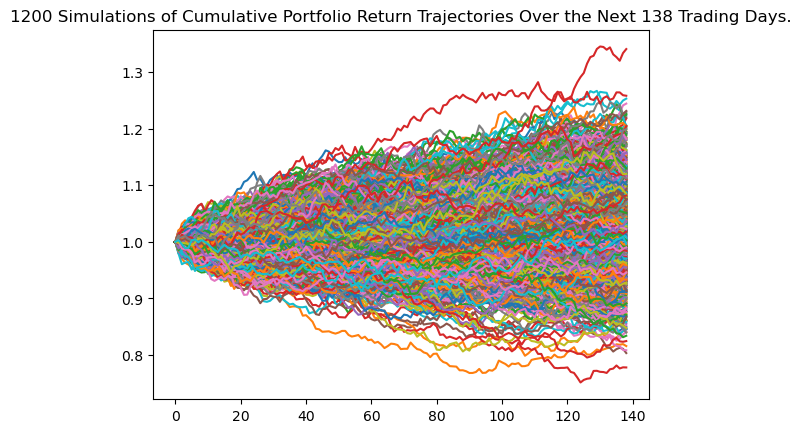

In [51]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

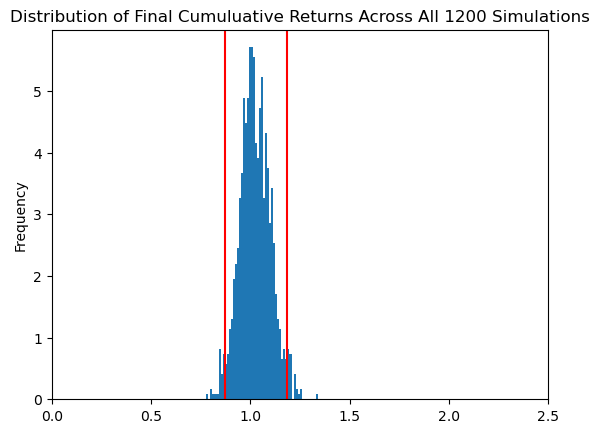

In [52]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           1200.000000
mean               0.914690
std                0.062272
min                0.738993
25%                0.870708
50%                0.911835
75%                0.954782
max                1.145113
95% CI Lower       0.802976
95% CI Upper       1.037738
Name: 138, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           1200.000000
mean               0.977787
std                0.070126
min                0.785632
25%                0.931023
50%                0.973907
75%                1.023660
max                1.220264
95% CI Lower       0.846988
95% CI Upper       1.123190
Name: 138, dtype: float64


In [55]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           1200.000000
mean               1.024287
std                0.077246
min                0.778222
25%                0.972180
50%                1.019142
75%                1.077131
max                1.340482
95% CI Lower       0.870968
95% CI Upper       1.184323
Name: 138, dtype: float64


In [56]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8029.76 and $10377.38.
The actual realized value of the portfolio was $8977.02


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $8469.88 and $11231.90.
The actual realized value of the portfolio was $9553.68


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $8709.68 and $11843.23.
The actual realized value of the portfolio was $9905.82


In [60]:
# ending process
end_time = time.process_time()
print("Process time", end_time - start_time)

Process time 76.45584000000001
